In [4]:
import requests

# URL for the images and annotations
image_url = "http://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz"
annotations_url = "http://www.robots.ox.ac.uk/~vgg/data/pets/data/annotations.tar.gz"

# Downloading images
r = requests.get(image_url, stream=True)
with open("images.tar.gz", "wb") as f:
    for chunk in r.iter_content(chunk_size=1024):
        if chunk:
            f.write(chunk)

# Downloading annotations
r = requests.get(annotations_url, stream=True)
with open("annotations.tar.gz", "wb") as f:
    for chunk in r.iter_content(chunk_size=1024):
        if chunk:
            f.write(chunk)

print("Download complete!")

Download complete!


In [5]:
import tarfile

# Extract images and annotations
with tarfile.open("images.tar.gz", "r:gz") as tar:
    tar.extractall()

with tarfile.open("annotations.tar.gz", "r:gz") as tar:
    tar.extractall()

print("Extraction complete!")

Extraction complete!


7390


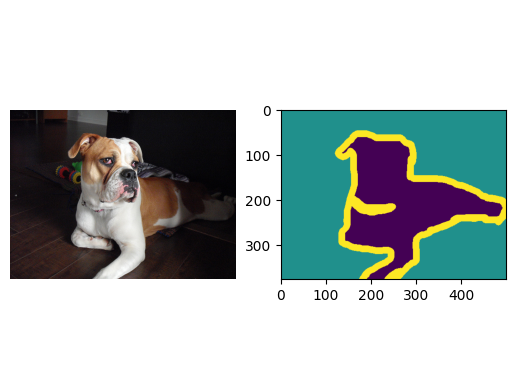

In [6]:
import os
import random

input_dir = "images/"
target_dir = "annotations/trimaps/"

input_img_paths = sorted(
    [os.path.join(input_dir, fname)
     for fname in os.listdir(input_dir)
     if fname.endswith(".jpg")])
target_paths = sorted(
    [os.path.join(target_dir, fname)
     for fname in os.listdir(target_dir)
     if fname.endswith(".png") and not fname.startswith(".")])

import matplotlib.pyplot as plt
from tensorflow.keras.utils import load_img, img_to_array
i = random.randint(1, 7390)
print(len(input_img_paths))
plt.axis("off")
plt.subplot(1,2,1)
plt.imshow(load_img(input_img_paths[i]))

def display_target(target_array):
    normalized_array = (target_array.astype("uint8") - 1) * 127
    plt.axis("off")
    plt.subplot(1,2,2)
    plt.imshow(normalized_array[:, :, 0])

img = img_to_array(load_img(target_paths[i], color_mode="grayscale"))
display_target(img)

Found 11350 files belonging to 2 classes.
Found 3428 files belonging to 2 classes.
Found 3478 files belonging to 2 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


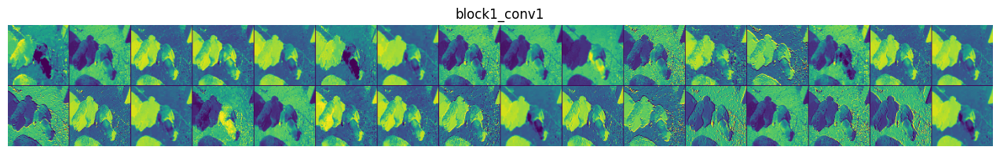

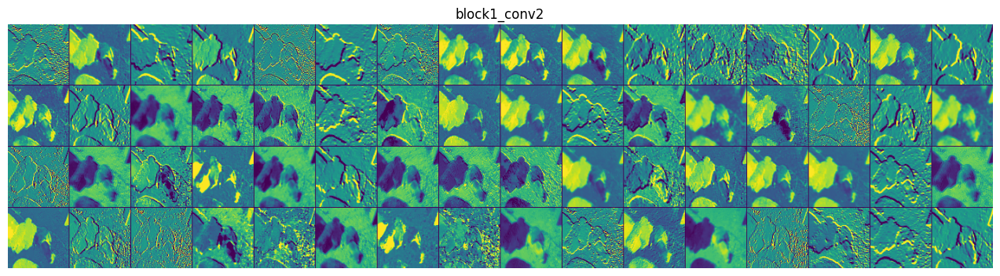

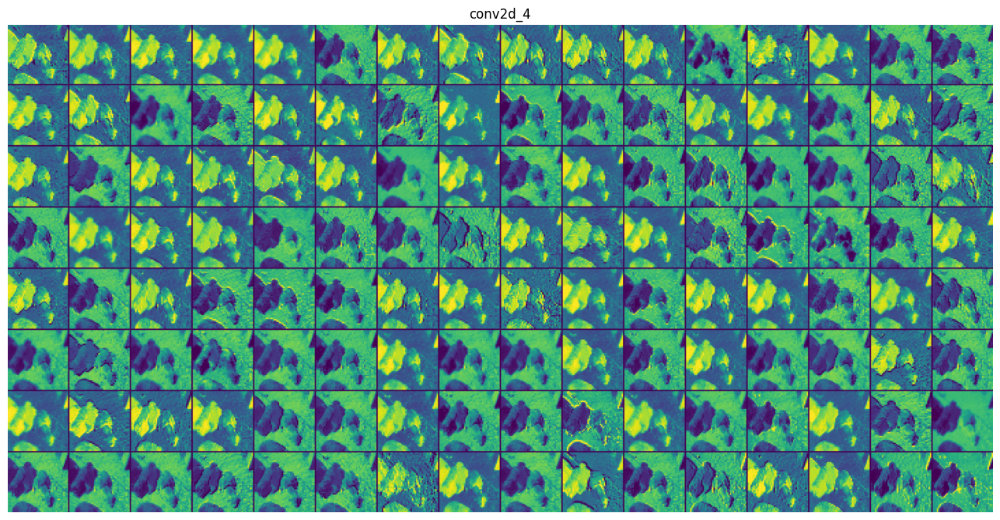

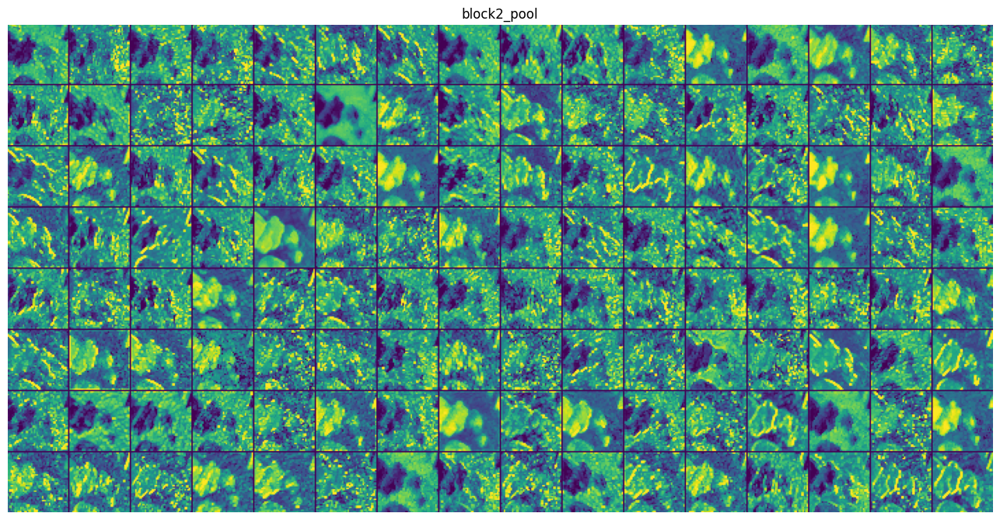

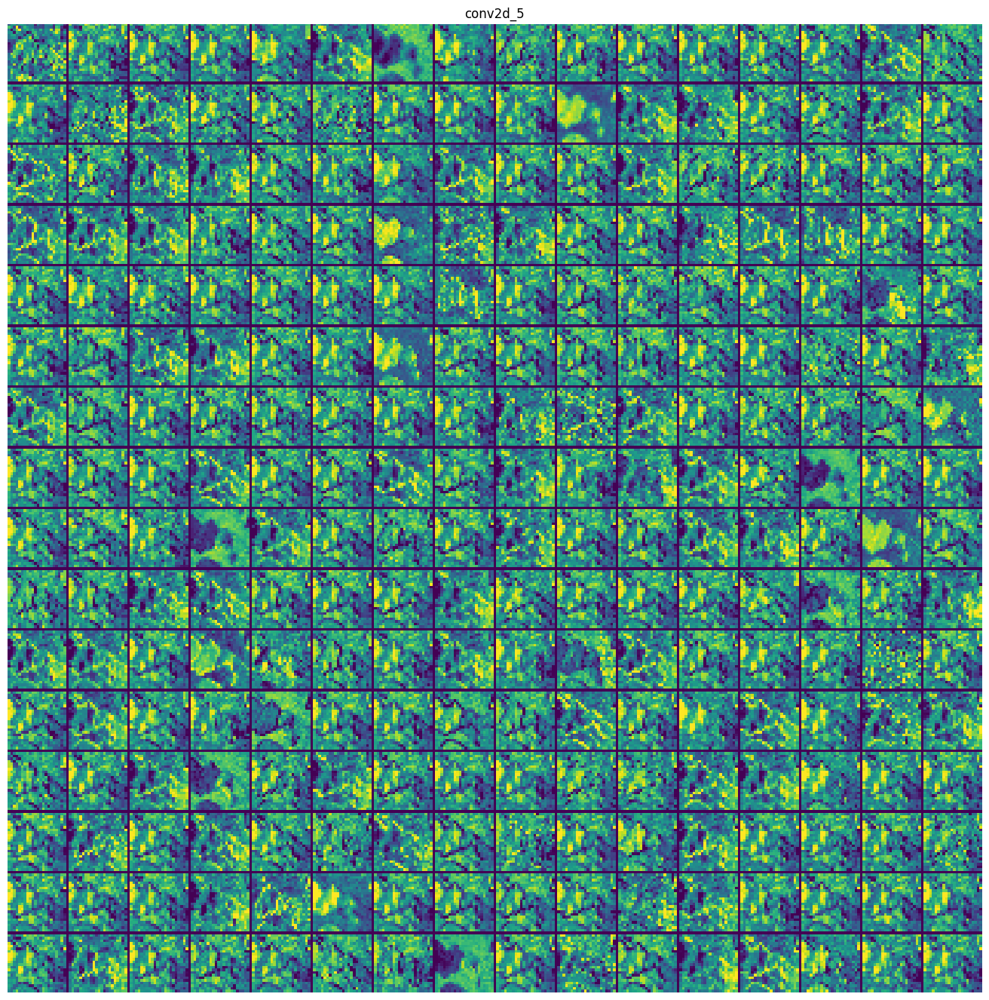

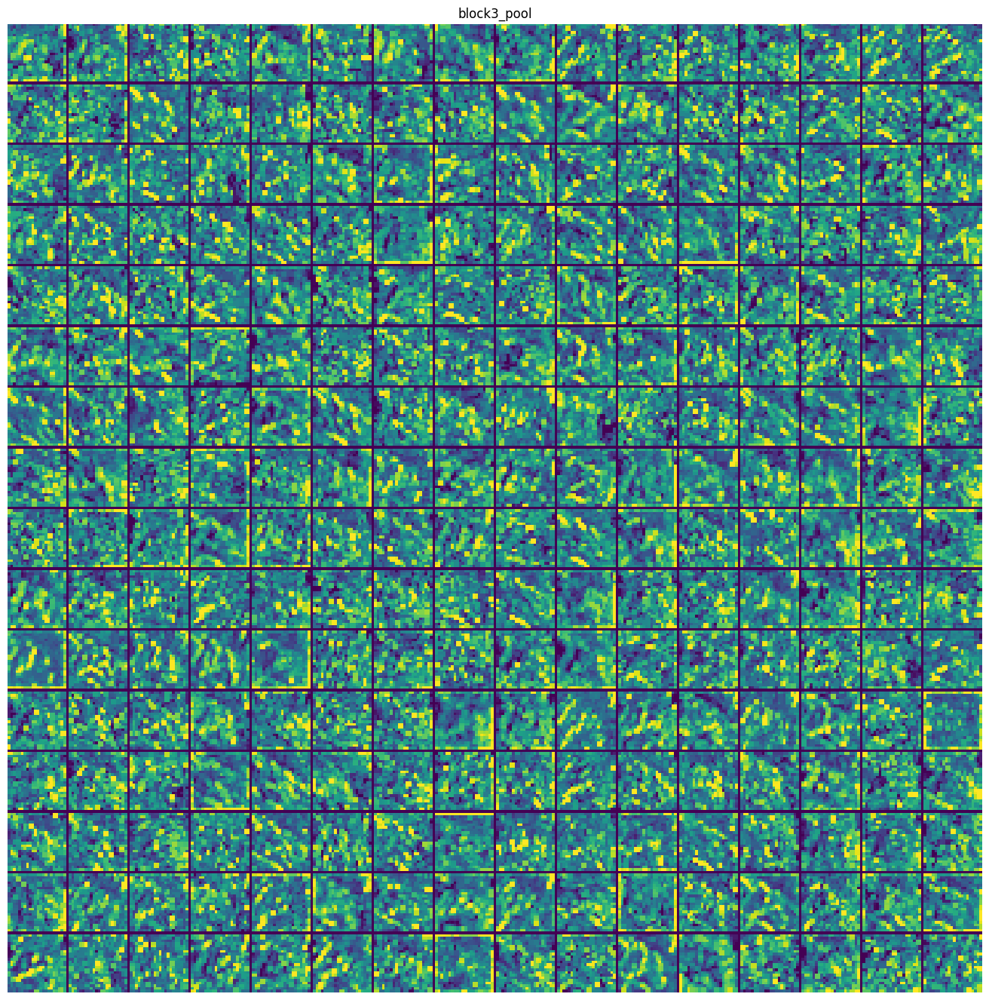

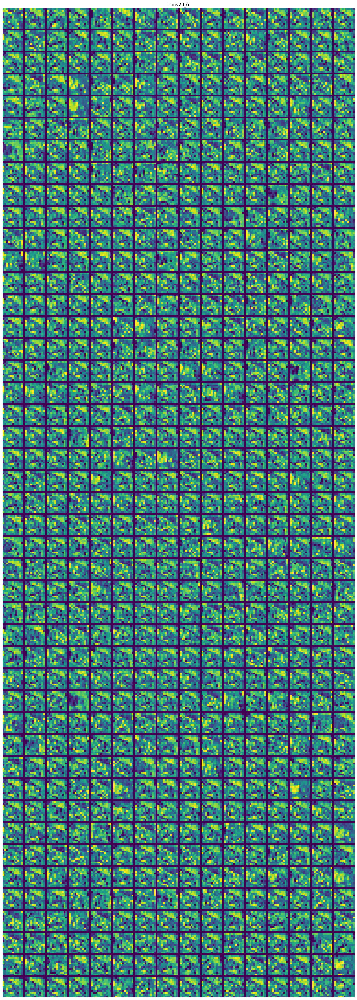

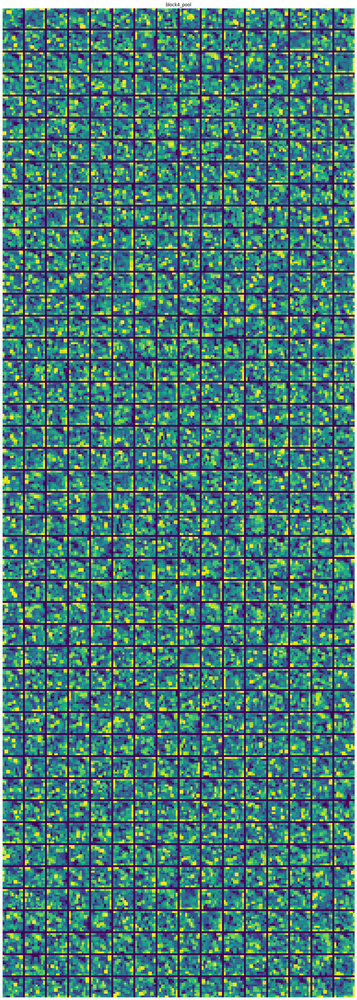

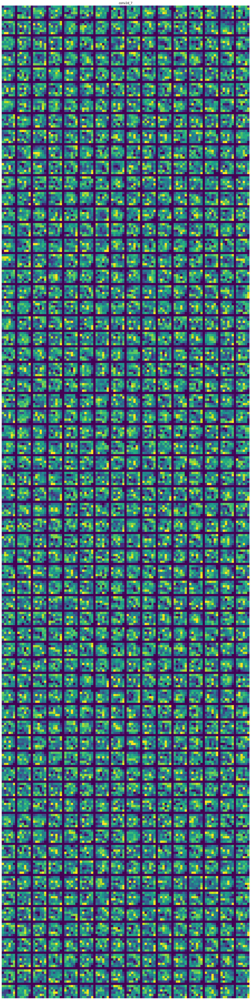

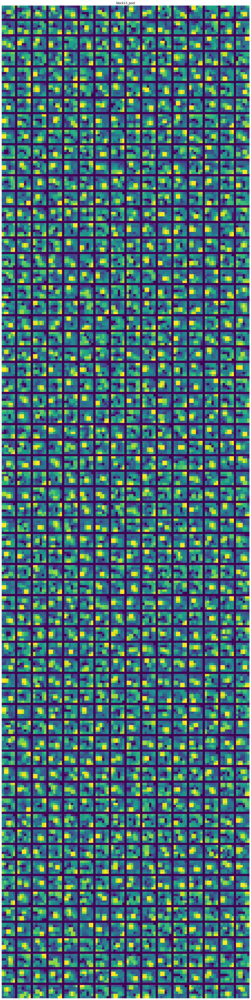

In [10]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
from tensorflow import keras
from tensorflow.keras.applications import Xception

# Path to your dataset folder
dataset_dir = '../Cat&Dog/CatsVsDogs/PetImages'  # Update with the path to your folder

# Load the dataset from the specified folders (train, val, test)
train_dir = os.path.join(dataset_dir, 'train')  # Path to 'train' folder
val_dir = os.path.join(dataset_dir, 'val')  # Path to 'val' folder
test_dir = os.path.join(dataset_dir, 'test')  # Path to 'test' folder

# Load the images from the directories
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    train_dir,  # Path to 'train' folder
    image_size=(180, 180),  # Resize all images to 180x180
    batch_size=32,
    label_mode='int'  # Labels will be integer (0 for 'Cat', 1 for 'Dog')
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    val_dir,  # Path to 'val' folder
    image_size=(180, 180),
    batch_size=32,
    label_mode='int'
)

test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    test_dir,  # Path to 'test' folder
    image_size=(180, 180),
    batch_size=32,
    label_mode='int'
)

# Load the pre-trained Xception model without the top layers (include_top=False)
model = Xception(weights="imagenet", include_top=False)

# Extract the activation layers (Conv2D, MaxPooling2D)
layer_outputs = [layer.output for layer in model.layers if isinstance(layer, (keras.layers.Conv2D, keras.layers.MaxPooling2D))]
layer_names = [layer.name for layer in model.layers if isinstance(layer, (keras.layers.Conv2D, keras.layers.MaxPooling2D))]

# Create a model that returns the outputs of the convolutional layers
activation_model = keras.Model(inputs=model.input, outputs=layer_outputs)

# Preprocessing function for the images (Xception requires specific preprocessing)
def preprocess_image(image):
    image = tf.keras.applications.xception.preprocess_input(image)  # Preprocess image for Xception model
    return image

# Select a random image from the dataset
random_image, random_label = next(iter(train_ds))  # Get one batch of images and labels
random_image = random_image[0]
# Preprocess the image
random_image = preprocess_image(random_image)

# Add a batch dimension to the image (as the model expects a batch of images)
random_image = tf.expand_dims(random_image, axis=0)

# Get activations of the image
activations = activation_model.predict(random_image)

# Display the activations
images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]  # Number of filters in this layer
    size = layer_activation.shape[1]  # Height/Width of the feature maps
    n_cols = n_features // images_per_row  # Number of columns for display
    display_grid = np.zeros(((size + 1) * n_cols - 1, images_per_row * (size + 1) - 1))  # Grid for visualization
    
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_index = col * images_per_row + row
            if channel_index >= n_features:
                break  # Avoid out-of-bounds errors
            
            channel_image = layer_activation[0, :, :, channel_index].copy()
            if channel_image.sum() != 0:
                channel_image -= channel_image.mean()
                channel_image /= (channel_image.std() + 1e-5)  # Avoid division by zero
                channel_image *= 64
                channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype("uint8")
            
            # Place the image in the correct position in the display grid
            display_grid[col * (size + 1): (col + 1) * size + col, row * (size + 1): (row + 1) * size + row] = channel_image
    
    # Scale the display grid for better visualization
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.axis("off")
    plt.imshow(display_grid, aspect="auto", cmap="viridis")
    plt.show()


block1_conv1
block1_conv2
block2_sepconv1
block2_sepconv2
conv2d_4
block3_sepconv1
block3_sepconv2
conv2d_5
block4_sepconv1
block4_sepconv2
conv2d_6
block5_sepconv1
block5_sepconv2
block5_sepconv3
block6_sepconv1
block6_sepconv2
block6_sepconv3
block7_sepconv1
block7_sepconv2
block7_sepconv3
block8_sepconv1
block8_sepconv2
block8_sepconv3
block9_sepconv1
block9_sepconv2
block9_sepconv3
block10_sepconv1
block10_sepconv2
block10_sepconv3
block11_sepconv1
block11_sepconv2
block11_sepconv3
block12_sepconv1
block12_sepconv2
block12_sepconv3
block13_sepconv1
block13_sepconv2
conv2d_7
block14_sepconv1
block14_sepconv2
132
Processing filter 0
Processing filter 1
Processing filter 2
Processing filter 3
Processing filter 4
Processing filter 5
Processing filter 6
Processing filter 7
Processing filter 8
Processing filter 9
Processing filter 10
Processing filter 11
Processing filter 12
Processing filter 13
Processing filter 14
Processing filter 15
Processing filter 16
Processing filter 17
Processin

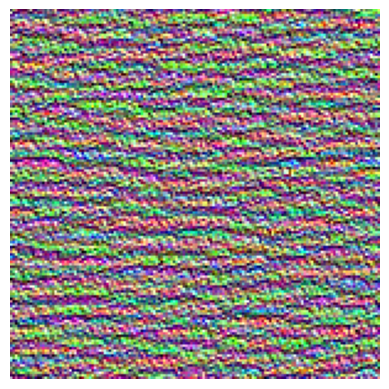

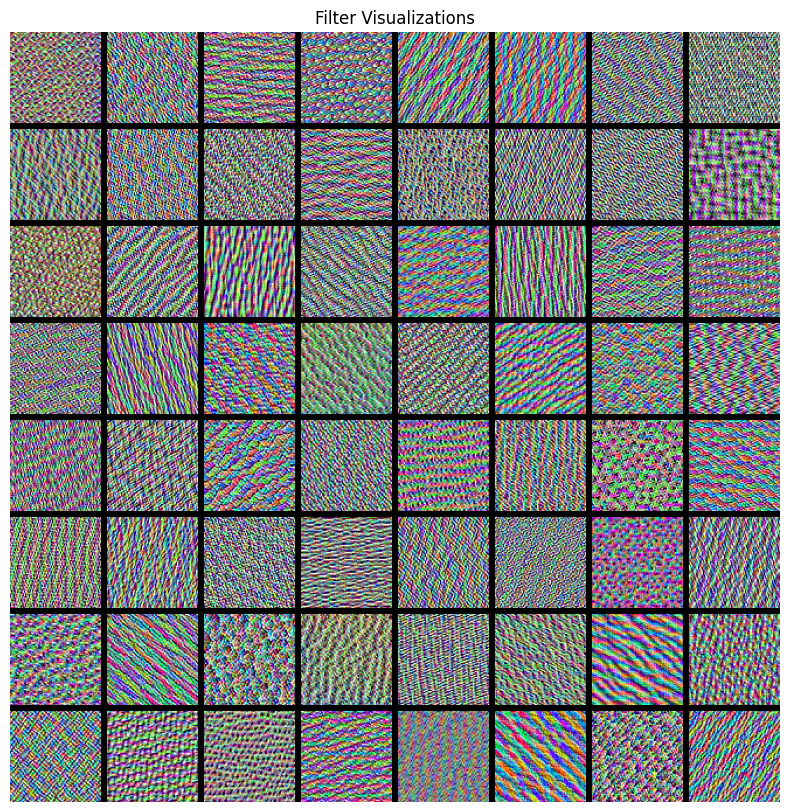

In [12]:
for layer in model.layers:
    if isinstance(layer, (keras.layers.Conv2D, keras.layers.SeparableConv2D)):
        print(layer.name)
print(len(model.layers))
layer_name = "block3_sepconv1"
layer = model.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model.input, outputs=layer.output)
activation = feature_extractor(
    keras.applications.xception.preprocess_input(random_image)
)

import tensorflow as tf

def compute_loss(image, filter_index):
    activation = feature_extractor(image)
    filter_activation = activation[:, 2:-2, 2:-2, filter_index]
    return tf.reduce_mean(filter_activation)

@tf.function
def gradient_ascent_step(image, filter_index, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(image)
        loss = compute_loss(image, filter_index)
    grads = tape.gradient(loss, image)
    grads = tf.math.l2_normalize(grads)
    image += learning_rate * grads
    return image

img_width = 200
img_height = 200

def generate_filter_pattern(filter_index):
    iterations = 30
    learning_rate = 10.
    image = tf.random.uniform(
        minval=0.4,
        maxval=0.6,
        shape=(1, img_width, img_height, 3))
    for i in range(iterations):
        image = gradient_ascent_step(image, filter_index, learning_rate)
    return image[0].numpy()

def deprocess_image(image):
    image -= image.mean()
    image /= image.std()
    image *= 64
    image += 128
    image = np.clip(image, 0, 255).astype("uint8")
    image = image[25:-25, 25:-25, :]
    return image

plt.axis("off")
plt.imshow(deprocess_image(generate_filter_pattern(filter_index=2)))

n = 8 
margin = 5 
img_width = 128 
img_height = 128 

all_images = []
for filter_index in range(n * n):
    print(f"Processing filter {filter_index}")
    image = deprocess_image(generate_filter_pattern(filter_index))
    all_images.append(image)

cropped_width = img_width - 25 * 2
cropped_height = img_height - 25 * 2
width = n * cropped_width + (n - 1) * margin
height = n * cropped_height + (n - 1) * margin
stitched_filters = np.zeros((height, width, 3), dtype="uint8")

for i in range(n):
    for j in range(n):
        image = all_images[i * n + j]
        stitched_filters[
            i * (cropped_height + margin): i * (cropped_height + margin) + cropped_height,
            j * (cropped_width + margin): j * (cropped_width + margin) + cropped_width,
            :
        ] = image

plt.figure(figsize=(10, 10))
plt.imshow(stitched_filters)
plt.axis("off")
plt.title("Filter Visualizations")
plt.show()